# Разведочный анализ данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
#Считываем датасет из файла
df = pd.read_csv('Metabolic Syndrome.csv')
df_for_cat = pd.read_csv('Metabolic Syndrome.csv')
pd.set_option('display.max_columns', None)
df.head()

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,62161,22,Male,Single,8200.0,White,81.0,23.3,0,3.88,4.9,92,41,84,0
1,62164,44,Female,Married,4500.0,White,80.1,23.2,0,8.55,4.5,82,28,56,0
2,62169,21,Male,Single,800.0,Asian,69.6,20.1,0,5.07,5.4,107,43,78,0
3,62172,43,Female,Single,2000.0,Black,120.4,33.3,0,5.22,5.0,104,73,141,0
4,62177,51,Male,Married,NaN,Asian,81.1,20.1,0,8.13,5.0,95,43,126,0


In [188]:
df.shape # размерность данных

(2401, 15)

In [189]:
df.info() # информация о признаках

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2401 entries, 0 to 2400
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   seqn               2401 non-null   int64  
 1   Age                2401 non-null   int64  
 2   Sex                2401 non-null   object 
 3   Marital            2193 non-null   object 
 4   Income             2284 non-null   float64
 5   Race               2401 non-null   object 
 6   WaistCirc          2316 non-null   float64
 7   BMI                2375 non-null   float64
 8   Albuminuria        2401 non-null   int64  
 9   UrAlbCr            2401 non-null   float64
 10  UricAcid           2401 non-null   float64
 11  BloodGlucose       2401 non-null   int64  
 12  HDL                2401 non-null   int64  
 13  Triglycerides      2401 non-null   int64  
 14  MetabolicSyndrome  2401 non-null   int64  
dtypes: float64(5), int64(7), object(3)
memory usage: 281.5+ KB


In [190]:
df.describe().round(2) # Функция describe оценивает столбцы с числовым типом данных (int или float) и возвращает статистические данные, которые дают представление о распределении значений

,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
count,2401.00,2401.00,2284.00,2316.00,2375.00,2401.00,2401.00,2401.00,2401.00,2401.00,2401.00,2401.00
mean,67030.67,48.69,4005.25,98.31,28.70,0.15,43.63,5.49,108.25,53.37,128.13,0.34
std,2823.57,17.63,2954.03,16.25,6.66,0.42,258.27,1.44,34.82,15.19,95.32,0.47
min,62161.00,20.00,300.00,56.20,13.40,0.00,1.40,1.80,39.00,14.00,26.00,0.00
25%,64591.00,34.00,1600.00,86.68,24.00,0.00,4.45,4.50,92.00,43.00,75.00,0.00
50%,67059.00,48.00,2500.00,97.00,27.70,0.00,7.07,5.40,99.00,51.00,103.00,0.00
75%,69495.00,63.00,6200.00,107.62,32.10,0.00,13.69,6.40,110.00,62.00,150.00,1.00
max,71915.00,80.00,9000.00,176.00,68.70,2.00,5928.00,11.30,382.00,156.00,1562.00,1.00


In [191]:
df.duplicated().sum() # проверяем наличие дубликатов

0

In [192]:
df.isna().sum() # количество пропущенных значений

seqn                   0
Age                    0
Sex                    0
Marital              208
Income               117
Race                   0
WaistCirc             85
BMI                   26
Albuminuria            0
UrAlbCr                0
UricAcid               0
BloodGlucose           0
HDL                    0
Triglycerides          0
MetabolicSyndrome      0
dtype: int64

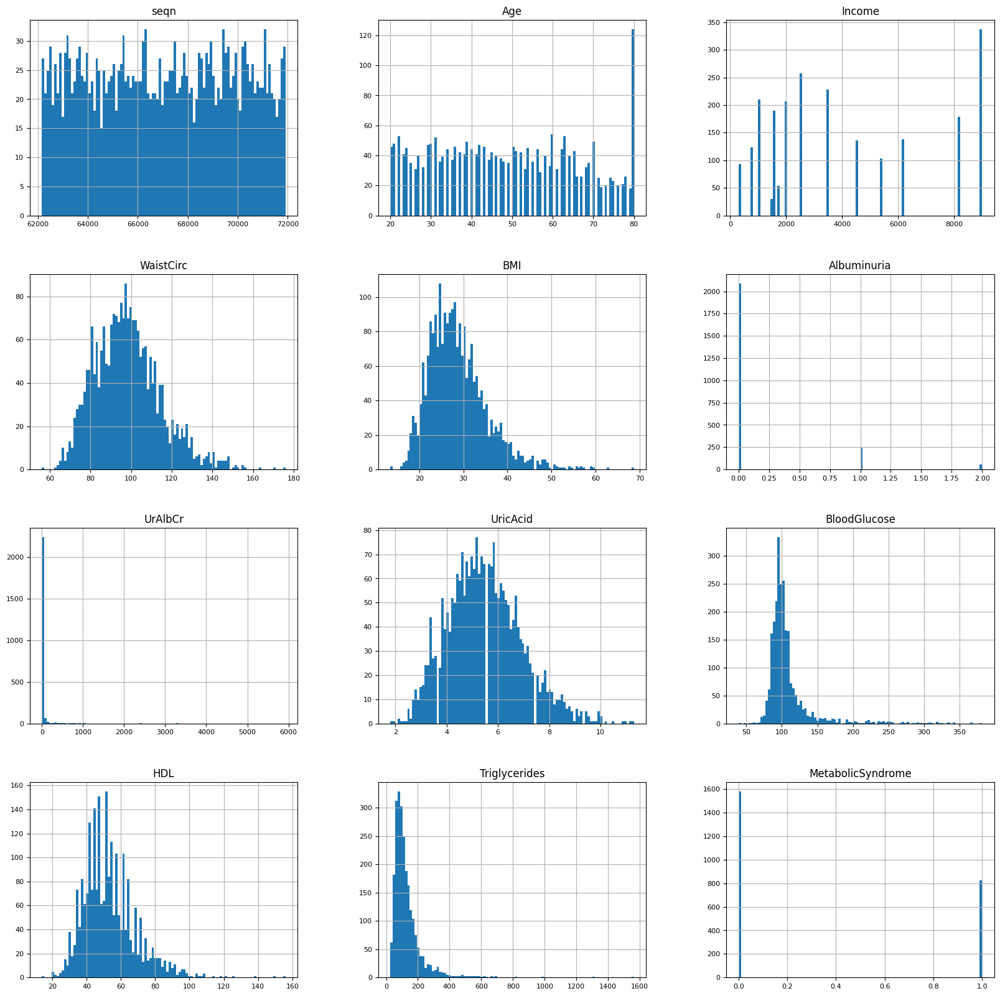

In [8]:
df.hist(figsize=(20, 20), bins=100, xlabelsize=8, ylabelsize=8); # гистограммы распределения значений признаков

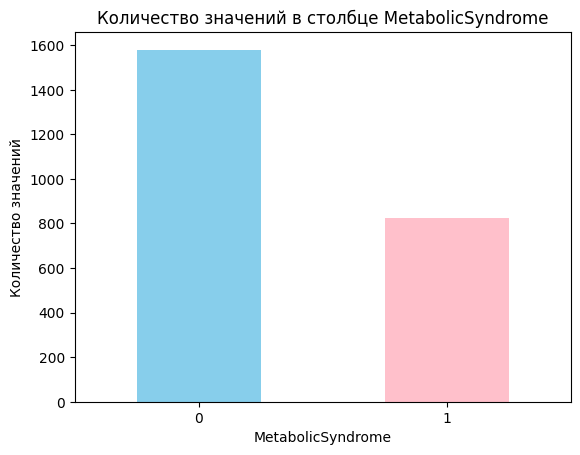

In [10]:
# Так как у нас очевидный дислбаланс классов, то мы будем использовать метрику Weighted F1-Score
value_counts = df['MetabolicSyndrome'].value_counts()
value_counts.plot(kind='bar', color=['skyblue', 'pink'])
plt.xlabel('MetabolicSyndrome')
plt.ylabel('Количество значений')
plt.title('Количество значений в столбце MetabolicSyndrome')
plt.xticks(rotation=0)
plt.show()

In [10]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile
# Тоже самое можно посмотреть отдельными командами - это выгонее в плане ожидания и возможности выбирать, что именно смотреть/визуализировать

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Предобработка данных

In [3]:
df_preprocessing = df

In [4]:
unique_sex = df_preprocessing['Sex'].unique()
count_per_sex = df_preprocessing['Sex'].value_counts()

# Выводим результаты
print("Уникальные значения в столбце 'Sex':")
print(unique_sex)

print("\nКоличество каждого значения в столбце 'Sex':")
print(count_per_sex)

Уникальные значения в столбце 'Sex':
['Male' 'Female']

Количество каждого значения в столбце 'Sex':
Sex
Female    1211
Male      1190
Name: count, dtype: int64


In [5]:
df_preprocessing = df
df_preprocessing['Sex'] = df_preprocessing['Sex'].replace({'Male': 1, 'Female': 0})
df_preprocessing.sample(5)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
919,65880,26,0,Single,1600.0,MexAmerican,83.1,25.8,0,4.22,3.6,94,72,44,0
1708,69105,55,1,Single,2000.0,Hispanic,91.9,26.5,0,5.25,5.0,87,42,149,0
768,65296,80,1,Married,5400.0,White,NaN,26.7,1,39.38,8.6,94,46,111,0
1702,69081,23,0,Single,9000.0,Black,66.3,20.2,0,2.54,4.6,77,67,47,0
1769,69388,61,1,Married,1600.0,MexAmerican,NaN,37.4,1,61.03,5.7,129,41,103,0


In [6]:
unique_race = df_preprocessing['Race'].unique()
count_per_race = df_preprocessing['Race'].value_counts()

# Выводим результаты
print("Уникальные значения в столбце 'Race':")
print(unique_race)

print("\nКоличество каждого значения в столбце 'Race':")
print(count_per_race)

Уникальные значения в столбце 'Race':
['White' 'Asian' 'Black' 'MexAmerican' 'Hispanic' 'Other']

Количество каждого значения в столбце 'Race':
Race
White          933
Black          548
Asian          349
Hispanic       257
MexAmerican    253
Other           61
Name: count, dtype: int64


In [7]:
race_mapping = {
    'White': 1,
    'Black': 2,
    'Asian': 3,
    'Hispanic': 4,
    'MexAmerican': 5,
    'Other': 6
}

# Применяем соответствие к каждому столбцу
df_preprocessing['Race'] = df_preprocessing['Race'].replace(race_mapping)
df_preprocessing.sample(5)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
1448,68061,35,0,Married,9000.0,3,78.0,20.5,0,4.43,4.4,96,71,78,0
1688,69019,44,0,Married,1500.0,1,91.9,27.3,0,4.12,5.1,93,38,112,0
930,65927,65,0,Married,4500.0,1,119.1,33.3,0,8.60,4.7,105,64,147,0
1182,66961,36,1,Married,6200.0,3,94.5,25.3,0,9.37,7.1,100,44,263,0
1038,66335,35,1,NaN,2000.0,1,102.0,28.3,0,8.35,6.9,88,53,205,0


In [8]:
unique_marital = df_preprocessing['Marital'].unique()
count_per_marital = df_preprocessing['Marital'].value_counts()

# Выводим результаты
print("Уникальные значения в столбце 'Marital':")
print(unique_marital)

print("\nКоличество каждого значения в столбце 'Marital':")
print(count_per_marital)

Уникальные значения в столбце 'Marital':
['Single' 'Married' 'Widowed' 'Divorced' nan 'Separated']

Количество каждого значения в столбце 'Marital':
Marital
Married      1192
Single        498
Divorced      242
Widowed       166
Separated      95
Name: count, dtype: int64


In [9]:
marital_mapping = {
    'Married': 1,
    'Single': 2,
    'Divorced': 3,
    'Widowed': 4,
    'MexAmerican': 5,
    'Separated': 6
}

# Применяем соответствие к каждому столбцу
df_preprocessing['Marital'] = df_preprocessing['Marital'].replace(marital_mapping)
df_preprocessing['Marital'].fillna(7, inplace=True)
df_preprocessing.sample(5)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
397,63719,21,1,2.0,2000.0,1,72.9,19.3,0,8.70,5.0,115,50,58,0
148,62757,54,1,3.0,6200.0,1,127.7,36.1,0,4.20,5.1,98,34,668,1
467,63989,53,0,3.0,1000.0,6,NaN,13.6,0,5.66,2.4,102,58,89,0
345,63531,32,1,7.0,1500.0,5,94.1,28.0,0,8.62,8.7,91,42,53,0
1942,70033,53,0,1.0,1700.0,1,103.1,32.3,0,8.93,5.8,102,46,113,1


In [10]:
df_filled = df_preprocessing.fillna(df_preprocessing.mean())

In [11]:
df_filled.isna().sum()

seqn                 0
Age                  0
Sex                  0
Marital              0
Income               0
Race                 0
WaistCirc            0
BMI                  0
Albuminuria          0
UrAlbCr              0
UricAcid             0
BloodGlucose         0
HDL                  0
Triglycerides        0
MetabolicSyndrome    0
dtype: int64

In [12]:
df_filled.sample(5)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
1757,69339,22,1,7.0,4500.0,5,91.3,24.6,0,10.62,5.1,98,32,128,0
1642,68860,34,1,1.0,3500.0,1,86.0,23.5,0,10.45,5.3,70,68,167,0
1558,68553,61,0,3.0,2500.0,1,111.2,35.2,1,31.09,5.2,118,53,131,0
2293,71455,70,1,2.0,1000.0,1,99.0,24.4,0,4.58,4.4,89,49,140,0
1050,66386,50,0,6.0,6200.0,4,105.0,34.9,0,8.08,4.8,97,57,115,0


In [13]:
df_num = df_filled.select_dtypes(include = ['float64', 'int64']) # выбираем только числовые признаки
df_num.sample(5)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
1262,67315,51,0,3.0,3500.0,2,89.8,24.9,0,4.40,3.5,93,39,158,1
1217,67134,29,1,2.0,5400.0,4,87.5,24.0,0,5.08,6.0,85,57,138,0
1341,67616,63,1,7.0,800.0,1,87.2,20.6,0,4.28,6.1,116,54,125,0
1030,66317,43,1,1.0,6200.0,1,97.0,26.3,0,5.00,6.0,94,48,123,0
1567,68574,20,1,2.0,3500.0,5,88.9,23.9,0,11.22,6.8,99,58,112,0


In [14]:
corr_df = df_num.corr()['MetabolicSyndrome'][:-1]
correlated_features_list = corr_df[abs(corr_df) > 0].sort_values(ascending=False)
print("There are {} strongly values with MetabolicSyndrome:\n{}".format(len(correlated_features_list), 
                                                                          correlated_features_list))

There are 14 strongly values with MetabolicSyndrome:
WaistCirc        0.490490
BMI              0.428976
Triglycerides    0.427241
BloodGlucose     0.362219
Age              0.248618
UricAcid         0.246423
Albuminuria      0.158501
UrAlbCr          0.085168
Sex              0.020355
seqn             0.011364
Race             0.004521
Marital         -0.011429
Income          -0.081767
HDL             -0.371378
Name: MetabolicSyndrome, dtype: float64


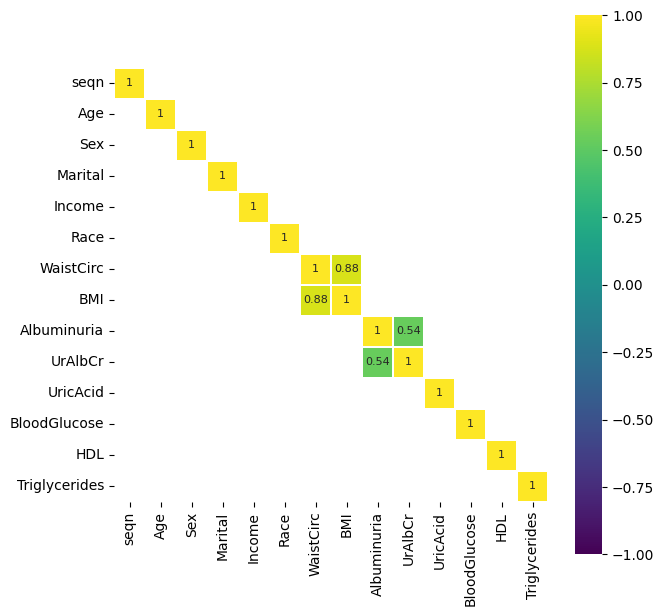

In [73]:
corr = df_num.drop('MetabolicSyndrome', axis=1).corr()
plt.figure(figsize=(7, 7))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.5)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

# Разбиение данных

In [15]:
from sklearn.model_selection import train_test_split

In [16]:
X = df_filled

In [17]:
# Разобьем выборку на тренировочную и тестовую:
X_train, X_test, y_train, y_test = train_test_split(X.drop(['MetabolicSyndrome'], axis=1), 
                                    X['MetabolicSyndrome'], stratify=X['MetabolicSyndrome'],
                                    test_size=0.3, random_state=77)

In [18]:
# Разобьем выборку на тренировочную и тестовую для CatBoost:
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(df_for_cat.drop(['MetabolicSyndrome'], axis=1), 
                                    df_for_cat['MetabolicSyndrome'], stratify=df_for_cat['MetabolicSyndrome'],
                                    test_size=0.3, random_state=77)

In [19]:
cat_features_indices = [2, 3, 5]
X_train_cat.iloc[:, cat_features_indices] = X_train_cat.iloc[:, cat_features_indices].fillna('NaN').astype(str)
X_test_cat.iloc[:, cat_features_indices] = X_test_cat.iloc[:, cat_features_indices].fillna('NaN').astype(str)

In [20]:
X_train.shape

(1680, 14)

In [21]:
X_test.shape

(721, 14)

# Дерево решений

## Настройка гиперпараметров

In [30]:
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, recall_score, RocCurveDisplay, classification_report, roc_curve, roc_auc_score, auc, f1_score, make_scorer
from tqdm import tqdm

In [343]:
clf_tree = tree.DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=0)

In [369]:
f1 = make_scorer(f1_score , average='weighted')

In [370]:
# Словарь с параметрами классификатора, комбинации которых мы будем подбирать и проверять на кроссвалидации:
params = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': range(1, 11),
    'min_samples_split': range(65, 70),
    'min_samples_leaf':  range(1, 11)
}

grid_search_cv_clf = GridSearchCV(clf_tree, params, cv=7, scoring=f1)
grid_search_cv_clf.fit(X_train, y_train)

GridSearchCV(cv=7,
             estimator=DecisionTreeClassifier(criterion='entropy', max_depth=10,
                                              random_state=0),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 11),
                         'min_samples_leaf': range(1, 11),
                         'min_samples_split': range(65, 70),
                         'splitter': ['best', 'random']},
             scoring=make_scorer(f1_score, average=weighted))

In [371]:
grid_search_cv_clf.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 5,
 'min_samples_split': 67,
 'splitter': 'best'}


Best Cross-Validation Result:
cv=7, Mean Accuracy: 0.8744047619047618


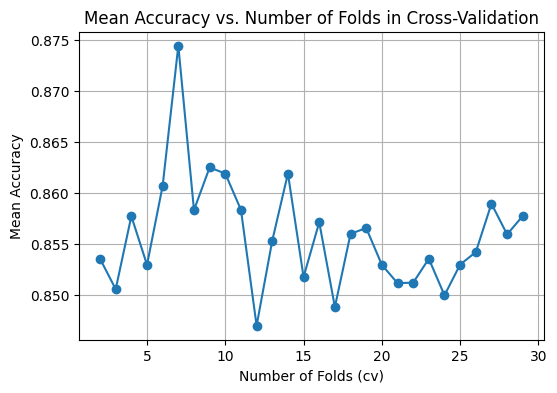

In [377]:
cv_values = range(2, 30)

mean_accuracies = []

# Индекс лучшего результата
best_cv_index = -1
best_mean_accuracy = float('-inf')

# Перебираем значения cv
for i, cv in enumerate(cv_values):
    scores = cross_val_score(best_clf_tree, X_train, y_train, cv=cv)
    mean_accuracy = scores.mean()
    mean_accuracies.append(mean_accuracy)

    # Обновляем лучший результат, если текущий лучше
    if mean_accuracy > best_mean_accuracy:
        best_mean_accuracy = mean_accuracy
        best_cv_index = i

# Выводим только лучший результат
best_cv_value = cv_values[best_cv_index]
print(f'\nBest Cross-Validation Result:')
print(f'cv={best_cv_value}, Mean Accuracy: {best_mean_accuracy}')

# Строим график
plt.figure(figsize=(6, 4))
plt.plot(cv_values, mean_accuracies, marker='o')
plt.title('Mean Accuracy vs. Number of Folds in Cross-Validation')
plt.xlabel('Number of Folds (cv)')
plt.ylabel('Mean Accuracy')
plt.grid(True)
plt.show()

In [372]:
best_clf_tree = grid_search_cv_clf.best_estimator_
best_clf_tree

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5,
                       min_samples_split=67, random_state=0)

In [51]:
best_clf_tree = tree.DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5, min_samples_split=67, random_state=0)
best_clf_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5,
                       min_samples_split=67, random_state=0)

## Результаты

In [373]:
best_clf_tree.score(X_test, y_test)

0.8515950069348127

In [374]:
y_pred_tree = best_clf_tree.predict(X_test)
print('precision_score: ', precision_score(y_test, y_pred_tree))
print('recall_score: ', recall_score(y_test, y_pred_tree))
print('f1: ', f1_score(y_test, y_pred_tree, average='weighted'))

precision_score:  0.7464788732394366
recall_score:  0.8582995951417004
f1:  0.8537517129019486


In [375]:
y_pred_prob_tree = best_clf_tree.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred_prob_tree)
print("AUC-ROC Score:", auc_score)

AUC-ROC Score: 0.9358120227540614


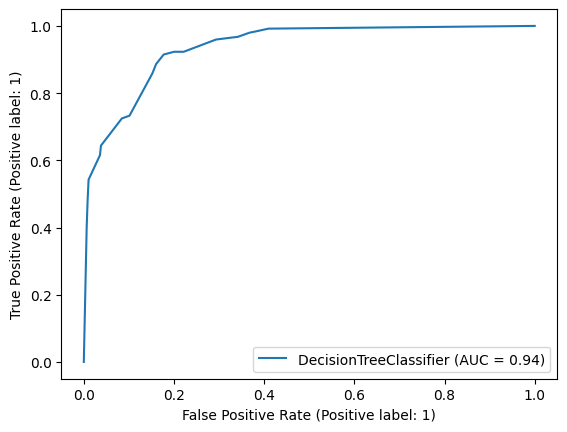

In [376]:
RocCurveDisplay.from_estimator(best_clf_tree, X_test, y_test)

In [62]:
feature_importances = best_clf_tree.feature_importances_
feature_importances_df = pd.DataFrame({'features': list(X_test),
                                    'feature_importances': feature_importances})
feature_importances_df.sort_values('feature_importances', ascending=False)

,features,feature_importances
11,BloodGlucose,0.342777
13,Triglycerides,0.290329
7,BMI,0.109265
6,WaistCirc,0.099935
12,HDL,0.086703
2,Sex,0.063424
1,Age,0.007566
0,seqn,0.000000
3,Marital,0.000000
4,Income,0.000000


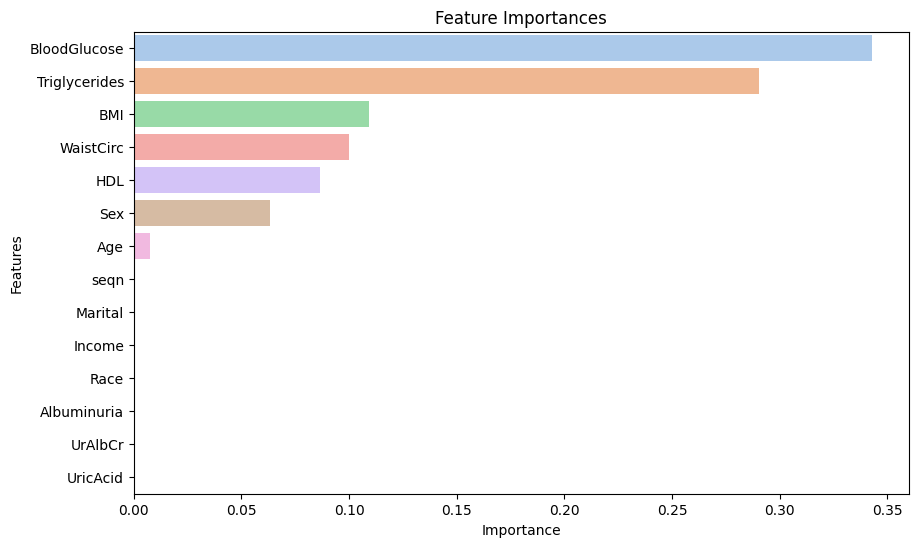

In [65]:
# Получение важности признаков из модели 
feature_importances = best_clf_tree.feature_importances_

# Создание DataFrame с именами признаков и их важностью
feature_importances_df = pd.DataFrame({'features': list(X_test.columns),
                                       'feature_importances': feature_importances})

# Сортировка DataFrame по важности признаков
feature_importances_df = feature_importances_df.sort_values(by='feature_importances', ascending=False)

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(x='feature_importances', y='features', data=feature_importances_df, palette='pastel')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

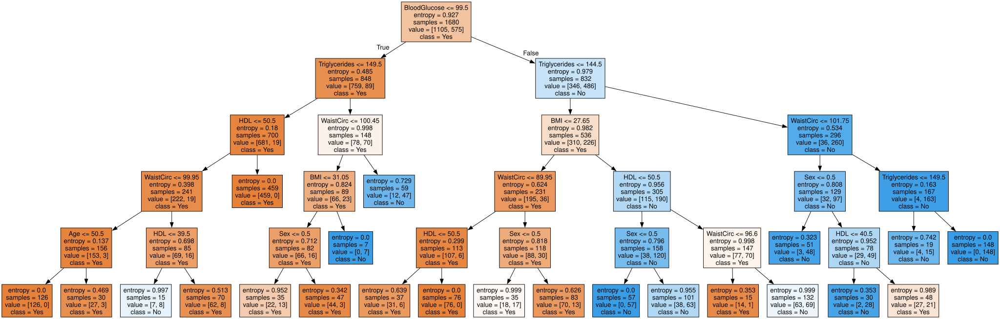

In [380]:
from IPython.display import SVG, display
from graphviz import Source
graph = Source(tree.export_graphviz(best_clf_tree, out_file=None,
                                   feature_names=list(X.drop(['MetabolicSyndrome'], axis=1)),
                                   class_names=['Yes', 'No'],
                                   filled = True))
display(SVG(graph.pipe(format='svg')))

## Повышаем Precision - понижаем Recall

In [389]:
y_pred_prob_tree = best_clf_tree.predict_proba(X_test)
pd.DataFrame(y_pred_prob_tree, columns=['Отсутствие синдрома', 'Наличие синдрома']).head()

,Отсутствие синдрома,Наличие синдрома
0,1.000000,0.000000
1,1.000000,0.000000
2,0.628571,0.371429
3,0.058824,0.941176
4,0.000000,1.000000


<Axes: >

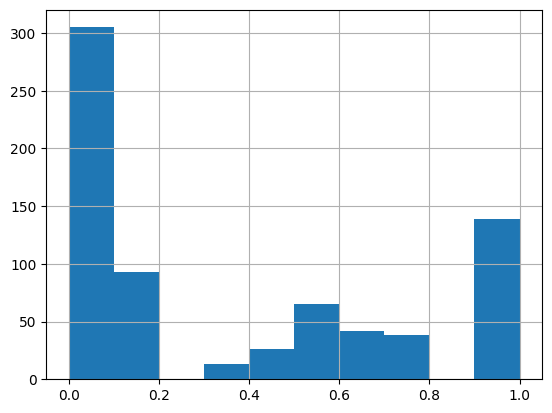

In [392]:
pd.Series(y_pred_prob_tree[:, 1]).hist()

In [408]:
y_pred_tree = np.where(y_pred_prob_tree[:, 1] > 0.47, 1, 0)
print('precision_score: ', precision_score(y_test, y_pred_tree))
print('recall_score: ', recall_score(y_test, y_pred_tree))
print('f1: ', f1_score(y_test, y_pred_tree, average='weighted'))

precision_score:  0.7423728813559322
recall_score:  0.8866396761133604
f1:  0.8582965779727145


# CatBoost

## CatBoost с предобработкой данных

In [22]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [23]:
from catboost import CatBoostClassifier, Pool, cv

In [24]:
clf_catboost = CatBoostClassifier(random_seed=42, task_type='GPU', devices='0')

In [29]:
# Определяем пространство поиска гиперпараметров
param_dist = {
    'iterations': [100, 300, 500, 750],
    'learning_rate': [0.01, 0.1, 0.3, 0.5],
    'depth': [5, 7, 10]
}

# Используем метод `grid_search` для поиска лучших гиперпараметров
grid_search_result = clf_catboost.grid_search(param_dist, 
                                              X=Pool(X_train, label=y_train), 
                                              cv=5, 
                                              partition_random_seed=42, 
                                              stratified=True, 
                                              refit=True, 
                                              shuffle=True)

0:	learn: 0.6810303	test: 0.6814828	best: 0.6814828 (0)	total: 100ms	remaining: 9.92s
1:	learn: 0.6681848	test: 0.6691513	best: 0.6691513 (1)	total: 128ms	remaining: 6.26s
2:	learn: 0.6576060	test: 0.6586126	best: 0.6586126 (2)	total: 155ms	remaining: 5s
3:	learn: 0.6460623	test: 0.6470157	best: 0.6470157 (3)	total: 181ms	remaining: 4.36s
4:	learn: 0.6347364	test: 0.6364713	best: 0.6364713 (4)	total: 210ms	remaining: 3.98s
5:	learn: 0.6228490	test: 0.6248526	best: 0.6248526 (5)	total: 237ms	remaining: 3.71s
6:	learn: 0.6136522	test: 0.6158074	best: 0.6158074 (6)	total: 264ms	remaining: 3.51s
7:	learn: 0.6012418	test: 0.6033311	best: 0.6033311 (7)	total: 292ms	remaining: 3.35s
8:	learn: 0.5892740	test: 0.5913288	best: 0.5913288 (8)	total: 322ms	remaining: 3.25s
9:	learn: 0.5806454	test: 0.5833408	best: 0.5833408 (9)	total: 349ms	remaining: 3.14s
10:	learn: 0.5715416	test: 0.5745753	best: 0.5745753 (10)	total: 377ms	remaining: 3.05s
11:	learn: 0.5628877	test: 0.5661861	best: 0.5661861 (1

In [154]:
grid_search_result['params']

{'depth': 5, 'iterations': 300, 'learning_rate': 0.1}

In [31]:
best_cat = CatBoostClassifier(iterations=300, depth=5, learning_rate=0.1, random_seed=42, task_type='GPU', devices='0')
best_cat.fit(X_train, y_train)

0:	learn: 0.5790168	total: 7.28ms	remaining: 2.17s
1:	learn: 0.4763830	total: 13.7ms	remaining: 2.05s
2:	learn: 0.4201849	total: 20.9ms	remaining: 2.07s
3:	learn: 0.3838703	total: 28.1ms	remaining: 2.08s
4:	learn: 0.3505331	total: 35ms	remaining: 2.07s
5:	learn: 0.3177758	total: 41.8ms	remaining: 2.05s
6:	learn: 0.3024951	total: 48.6ms	remaining: 2.03s
7:	learn: 0.2881276	total: 55.8ms	remaining: 2.04s
8:	learn: 0.2761403	total: 63.1ms	remaining: 2.04s
9:	learn: 0.2633082	total: 69.6ms	remaining: 2.02s
10:	learn: 0.2569164	total: 76.2ms	remaining: 2s
11:	learn: 0.2504264	total: 82.8ms	remaining: 1.99s
12:	learn: 0.2441826	total: 89.9ms	remaining: 1.98s
13:	learn: 0.2364126	total: 96.6ms	remaining: 1.97s
14:	learn: 0.2329905	total: 103ms	remaining: 1.96s
15:	learn: 0.2291586	total: 110ms	remaining: 1.95s
16:	learn: 0.2260733	total: 117ms	remaining: 1.95s
17:	learn: 0.2223412	total: 125ms	remaining: 1.95s
18:	learn: 0.2197373	total: 132ms	remaining: 1.94s
19:	learn: 0.2167026	total: 139m

In [45]:
y_pred_prob_cat = best_cat.predict_proba(X_test)
y_pred_cat = np.where(y_pred_prob_cat[:, 1] > 0.5, 1, 0)
print('precision_score: ', precision_score(y_test, y_pred_cat))
print('recall_score: ', recall_score(y_test, y_pred_cat))
print('f1: ', f1_score(y_test, y_pred_cat, average='weighted'))

precision_score:  0.8360655737704918
recall_score:  0.8259109311740891
f1:  0.8847119981577147


In [48]:
y_pred_prob_cat = best_cat.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred_prob_cat)
print("AUC-ROC Score:", auc_score)

AUC-ROC Score: 0.9652624745895898


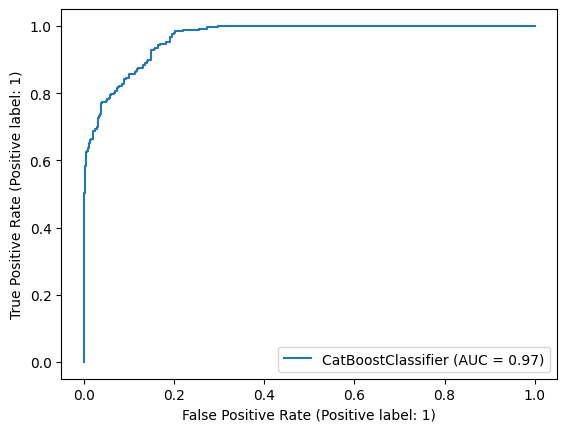

In [49]:
RocCurveDisplay.from_estimator(best_cat, X_test, y_test)

In [60]:
feature_importances = best_cat.feature_importances_
feature_importances_df = pd.DataFrame({'features': list(X_test),
                                    'feature_importances': feature_importances})
feature_importances_df.sort_values('feature_importances', ascending=False)

,features,feature_importances
11,BloodGlucose,17.911060
6,WaistCirc,15.782119
12,HDL,15.170233
13,Triglycerides,14.653965
2,Sex,9.803300
1,Age,5.258390
7,BMI,4.985422
9,UrAlbCr,4.447536
4,Income,3.581307
10,UricAcid,3.490884


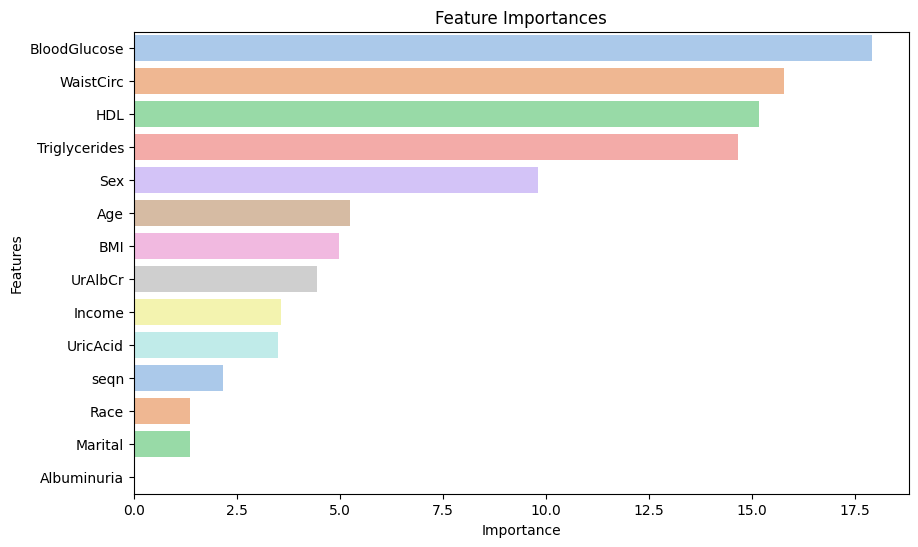

In [64]:
# Получение важности признаков из модели
feature_importances = best_cat.feature_importances_

# Создание DataFrame с именами признаков и их важностью
feature_importances_df = pd.DataFrame({'features': list(X_test.columns),
                                       'feature_importances': feature_importances})

# Сортировка DataFrame по важности признаков
feature_importances_df = feature_importances_df.sort_values(by='feature_importances', ascending=False)

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(x='feature_importances', y='features', data=feature_importances_df, palette='pastel')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

## CatBoost без предобработки данных

In [25]:
clf_catboosts = CatBoostClassifier(random_seed=42, task_type='GPU', devices='0')

In [26]:
# Определяем пространство поиска гиперпараметров
param_dists = {
    'iterations': [500, 750, 1000],
    'learning_rate': [0.001, 0.01, 0.1],
    'depth': [5, 7, 10]
}

# Используем метод `grid_search` для поиска лучших гиперпараметров
grid_search_results = clf_catboosts.grid_search(param_dists, 
                                              X=Pool(
                                                data=X_train_cat,
                                                label=y_train_cat,
                                                cat_features=cat_features_indices), 
                                              cv=5, 
                                              partition_random_seed=42, 
                                              stratified=True, 
                                              refit=True, 
                                              shuffle=True)

0:	learn: 0.6920503	test: 0.6920824	best: 0.6920824 (0)	total: 34.2ms	remaining: 17.1s
1:	learn: 0.6906565	test: 0.6907272	best: 0.6907272 (1)	total: 64.2ms	remaining: 16s
2:	learn: 0.6894509	test: 0.6895868	best: 0.6895868 (2)	total: 93.7ms	remaining: 15.5s
3:	learn: 0.6881347	test: 0.6883113	best: 0.6883113 (3)	total: 124ms	remaining: 15.4s
4:	learn: 0.6867797	test: 0.6869999	best: 0.6869999 (4)	total: 154ms	remaining: 15.3s
5:	learn: 0.6855302	test: 0.6857768	best: 0.6857768 (5)	total: 185ms	remaining: 15.2s
6:	learn: 0.6841502	test: 0.6843971	best: 0.6843971 (6)	total: 215ms	remaining: 15.2s
7:	learn: 0.6828844	test: 0.6832066	best: 0.6832066 (7)	total: 244ms	remaining: 15s
8:	learn: 0.6816349	test: 0.6819528	best: 0.6819528 (8)	total: 276ms	remaining: 15s
9:	learn: 0.6804143	test: 0.6807672	best: 0.6807672 (9)	total: 306ms	remaining: 15s
10:	learn: 0.6791604	test: 0.6795488	best: 0.6795488 (10)	total: 337ms	remaining: 15s
11:	learn: 0.6779785	test: 0.6783887	best: 0.6783887 (11)	t

In [27]:
grid_search_results['params']

{'depth': 10, 'iterations': 1000, 'learning_rate': 0.01}

In [28]:
train_pool = Pool(
    data=X_train_cat,
    label=y_train_cat,
    cat_features=cat_features_indices
)

best_cats = CatBoostClassifier(
    iterations=1000,
    depth=10,
    learning_rate=0.01,
    random_seed=42,
    task_type='GPU',
    devices='0',
    cat_features=cat_features_indices
)

best_cats.fit(train_pool)

0:	learn: 0.6764641	total: 60.7ms	remaining: 1m
1:	learn: 0.6611593	total: 94.4ms	remaining: 47.1s
2:	learn: 0.6490109	total: 183ms	remaining: 1m
3:	learn: 0.6376778	total: 412ms	remaining: 1m 42s
4:	learn: 0.6261639	total: 553ms	remaining: 1m 50s
5:	learn: 0.6124635	total: 609ms	remaining: 1m 40s
6:	learn: 0.6015488	total: 696ms	remaining: 1m 38s
7:	learn: 0.5889722	total: 782ms	remaining: 1m 36s
8:	learn: 0.5767555	total: 867ms	remaining: 1m 35s
9:	learn: 0.5647584	total: 910ms	remaining: 1m 30s
10:	learn: 0.5550667	total: 954ms	remaining: 1m 25s
11:	learn: 0.5456830	total: 1.18s	remaining: 1m 36s
12:	learn: 0.5369675	total: 1.4s	remaining: 1m 46s
13:	learn: 0.5275133	total: 1.63s	remaining: 1m 54s
14:	learn: 0.5201905	total: 1.84s	remaining: 2m 1s
15:	learn: 0.5123051	total: 1.87s	remaining: 1m 55s
16:	learn: 0.5020596	total: 1.96s	remaining: 1m 53s
17:	learn: 0.4947597	total: 2s	remaining: 1m 49s
18:	learn: 0.4867242	total: 2.23s	remaining: 1m 55s
19:	learn: 0.4793347	total: 2.46s	

In [41]:
y_pred_prob_cats = best_cats.predict_proba(X_test_cat)
y_pred_cats = np.where(y_pred_prob_cats[:, 1] > 0.53, 1, 0)
print('precision_score: ', precision_score(y_test_cat, y_pred_cats))
print('recall_score: ', recall_score(y_test_cat, y_pred_cats))
print('f1: ', f1_score(y_test_cat, y_pred_cats, average='weighted'))

precision_score:  0.8649789029535865
recall_score:  0.8299595141700404
f1:  0.8968401643334896


In [268]:
y_pred_prob_cats = best_cats.predict_proba(X_test_cat)[:, 1]
auc_score = roc_auc_score(y_test_cat, y_pred_prob_cats)
print("AUC-ROC Score:", auc_score)

AUC-ROC Score: 0.9695672970156648


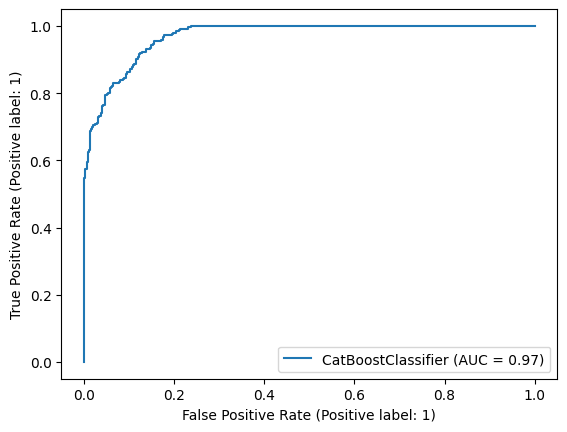

In [42]:
RocCurveDisplay.from_estimator(best_cats, X_test_cat, y_test_cat)

In [270]:
feature_importances = best_cats.feature_importances_
feature_importances_df = pd.DataFrame({'features': list(X_test_cat),
                                    'feature_importances': feature_importances})
feature_importances_df.sort_values('feature_importances', ascending=False)

,features,feature_importances
11,BloodGlucose,20.363979
6,WaistCirc,18.278032
13,Triglycerides,16.178628
12,HDL,15.672382
2,Sex,11.617814
7,BMI,4.392559
1,Age,3.539950
9,UrAlbCr,2.608430
4,Income,2.063419
3,Marital,1.701926


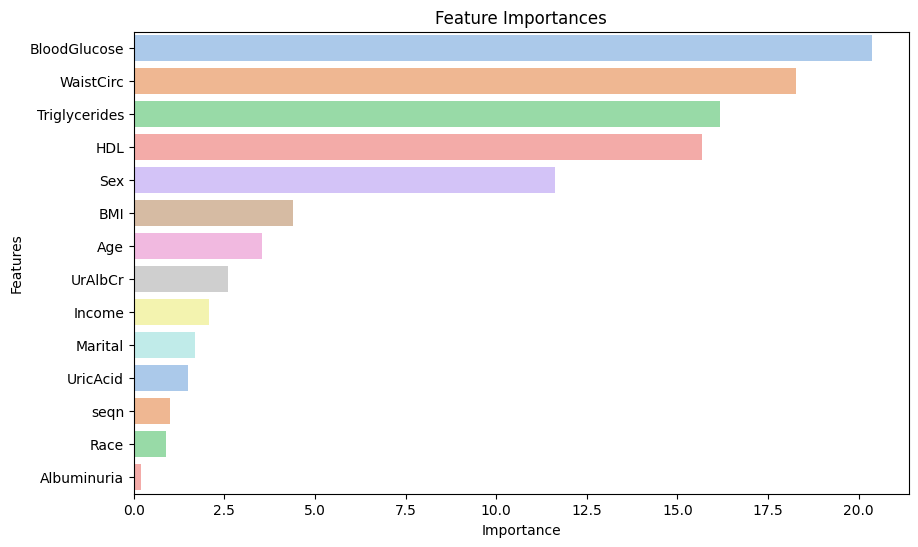

In [271]:
# Получение важности признаков из модели
feature_importances = best_cats.feature_importances_

# Создание DataFrame с именами признаков и их важностью
feature_importances_df = pd.DataFrame({'features': list(X_test_cat.columns),
                                       'feature_importances': feature_importances})

# Сортировка DataFrame по важности признаков
feature_importances_df = feature_importances_df.sort_values(by='feature_importances', ascending=False)

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(x='feature_importances', y='features', data=feature_importances_df, palette='pastel')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

# ROC-AUC

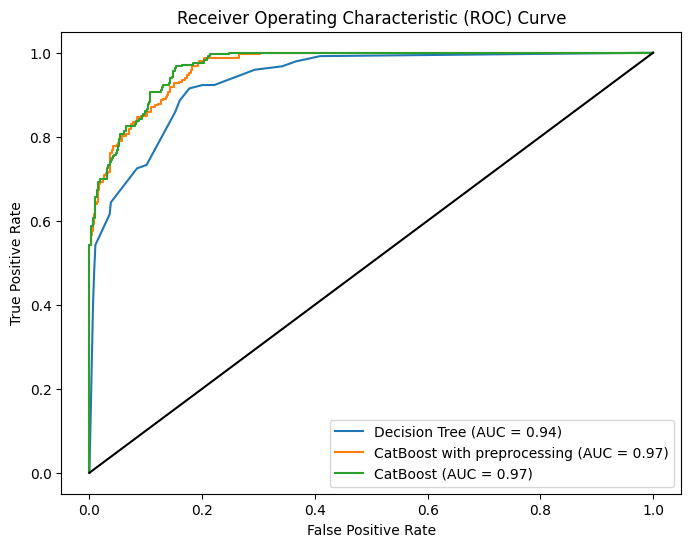

In [272]:
tree_probs = best_clf_tree.predict_proba(X_test)[:, 1]
cat_probs = best_cat.predict_proba(X_test)[:, 1]
cats_probs = best_cats.predict_proba(X_test_cat)[:, 1]

fpr_tree, tpr_tree, _ = roc_curve(y_test, tree_probs)
roc_auc_tree = auc(fpr_tree, tpr_tree)

fpr_cat, tpr_cat, _ = roc_curve(y_test, cat_probs)
roc_auc_cat = auc(fpr_cat, tpr_cat)

fpr_cats, tpr_cats, _ = roc_curve(y_test_cat, cats_probs)
roc_auc_cats = auc(fpr_cats, tpr_cats)

plt.figure(figsize=(8, 6))
plt.plot(fpr_tree, tpr_tree, label=f'Decision Tree (AUC = {roc_auc_tree:.2f})', linestyle='-')
plt.plot(fpr_cat, tpr_cat, label=f'CatBoost with preprocessing (AUC = {roc_auc_cat:.2f})', linestyle='-')
plt.plot(fpr_cats, tpr_cats, label=f'CatBoost (AUC = {roc_auc_cat:.2f})', linestyle='-')

plt.plot([0, 1], [0, 1], color='black', linestyle='-')  

plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# Итоговая модель

In [43]:
import joblib
# Сохранение модели в файл
joblib.dump(best_cats, 'CatBoost.joblib')

['CatBoost.joblib']